In [16]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import numpy as np 
import os 
import pandas as pd
import wandb

import seaborn as sns
import matplotlib.pyplot as plt

In [19]:
run = wandb.init(project= "Media Prediction")

In [21]:
cost_df = pd.read_csv("media prediction and its cost.csv")

#Using Sales country as stratify 
train_df, test_df = train_test_split(cost_df, train_size= 0.8, shuffle= True, stratify= cost_df['sales_country'])

cost_df['split'] = "train"
cost_df.loc[train_df.index, 'split'] = 'train'
cost_df.loc[test_df.index, 'split'] = 'test'

temp_df = cost_df[cost_df.split == 'test'].reset_index()

for i in temp_df.index.to_list():
    if i%2 == 1:
        cost_df.loc[temp_df.loc[i, 'index'], 'split'] = 'valid'

del temp_df
cost_df[cost_df.split == 'valid']

!mkdir "Media"
cost_df.to_csv("Media/Cost_prediction.csv")


In [22]:
arti = wandb.Artifact(name= "Cost_prediction_dataset", type="dataset")
arti.add_file("Media/Cost_prediction.csv")


In [ ]:
run.log_artifact(arti)

In [43]:
pd.set_option('display.max_columns', 50)

In [46]:
train = cost_df[cost_df.split == 'train']
train

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,total_children,education,member_card,occupation,houseowner,avg_cars_at home(approx),avg. yearly_income,num_children_at_home,avg_cars_at home(approx).1,brand_name,SRP,gross_weight,net_weight,recyclable_package,low_fat,units_per_case,store_type,store_city,store_state,store_sqft,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost,split
1,Breakfast Foods,Frozen Foods,Food,5.52,2.5944,3.0,Cash Register Lottery,USA,M,M,0.0,Bachelors Degree,Silver,Professional,Y,4.0,$50K - $70K,0.0,4.0,Carrington,1.84,19.70,17.70,1.0,0.0,17.0,Deluxe Supermarket,Salem,OR,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86,train
2,Breakfast Foods,Frozen Foods,Food,3.68,1.3616,2.0,High Roller Savings,USA,S,F,4.0,Partial High School,Normal,Manual,N,1.0,$10K - $30K,0.0,1.0,Carrington,1.84,19.70,17.70,1.0,0.0,17.0,Deluxe Supermarket,Salem,OR,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16,train
3,Breakfast Foods,Frozen Foods,Food,3.68,1.1776,2.0,Cash Register Lottery,USA,M,F,2.0,High School Degree,Bronze,Manual,Y,2.0,$30K - $50K,2.0,2.0,Carrington,1.84,19.70,17.70,1.0,0.0,17.0,Deluxe Supermarket,Salem,OR,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78,train
5,Breakfast Foods,Frozen Foods,Food,4.08,1.4688,3.0,Double Down Sale,USA,M,F,2.0,Bachelors Degree,Bronze,Professional,N,1.0,$50K - $70K,2.0,1.0,Golden,1.36,7.12,5.11,0.0,1.0,29.0,Deluxe Supermarket,Salem,OR,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79,train
6,Breakfast Foods,Frozen Foods,Food,5.44,2.5568,4.0,Cash Register Lottery,USA,S,F,4.0,High School Degree,Bronze,Skilled Manual,N,2.0,$30K - $50K,0.0,2.0,Golden,1.36,7.12,5.11,0.0,1.0,29.0,Deluxe Supermarket,Salem,OR,27694.0,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60420,Specialty,Carousel,Non-Consumable,4.84,1.6940,4.0,Price Winners,Mexico,S,F,1.0,Partial High School,Normal,Skilled Manual,Y,1.0,$10K - $30K,0.0,1.0,Toretti,1.21,18.90,15.80,0.0,0.0,26.0,Supermarket,Acapulco,Guerrero,23593.0,17475.0,3671.0,2447.0,0.0,0.0,0.0,0.0,0.0,Sunday Paper,112.19,train
60421,Specialty,Carousel,Non-Consumable,0.99,0.4554,1.0,Green Light Special,USA,S,F,2.0,High School Degree,Bronze,Professional,Y,3.0,$130K - $150K,0.0,3.0,King,0.99,11.70,10.60,1.0,0.0,25.0,Small Grocery,San Francisco,CA,22478.0,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,Cash Register Handout,127.19,train
60424,Specialty,Carousel,Non-Consumable,1.60,0.4960,1.0,Price Cutters,USA,S,F,2.0,High School Degree,Bronze,Skilled Manual,N,2.0,$30K - $50K,0.0,2.0,Symphony,1.60,17.40,15.30,1.0,0.0,36.0,Small Grocery,San Francisco,CA,22478.0,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,Sunday Paper,69.42,train
60425,Specialty,Carousel,Non-Consumable,5.52,2.5392,2.0,Weekend Markdown,USA,M,M,1.0,High School Degree,Bronze,Manual,Y,3.0,$30K - $50K,0.0,3.0,ADJ,2.76,19.60,18.60,1.0,0.0,26.0,Small Grocery,San Francisco,CA,22478.0,15321.0,4294.0,2863.0,1.0,0.0,0.0,0.0,0.0,"Sunday Paper, Radio, TV",67.51,train


In [49]:
train.columns

Index(['food_category', 'food_department', 'food_family',
       'store_sales(in millions)', 'store_cost(in millions)',
       'unit_sales(in millions)', 'promotion_name', 'sales_country',
       'marital_status', 'gender', 'total_children', 'education',
       'member_card', 'occupation', 'houseowner', 'avg_cars_at home(approx)',
       'avg. yearly_income', 'num_children_at_home',
       'avg_cars_at home(approx).1', 'brand_name', 'SRP', 'gross_weight',
       'net_weight', 'recyclable_package', 'low_fat', 'units_per_case',
       'store_type', 'store_city', 'store_state', 'store_sqft', 'grocery_sqft',
       'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar',
       'prepared_food', 'florist', 'media_type', 'cost', 'split'],
      dtype='object')

In [58]:
#Checking for outliers 

numeric = [a for a in train.columns if train[a].dtype == 'float64']
categoric = [a for a in train.columns if a not in numeric]

aesthetic = numeric[-6:]
numeric = numeric[:-6] #Excluding one-hot encoded value within dataset
numeric

['store_sales(in millions)',
 'store_cost(in millions)',
 'unit_sales(in millions)',
 'total_children',
 'avg_cars_at home(approx)',
 'num_children_at_home',
 'avg_cars_at home(approx).1',
 'SRP',
 'gross_weight',
 'net_weight',
 'recyclable_package',
 'low_fat',
 'units_per_case',
 'store_sqft',
 'grocery_sqft',
 'frozen_sqft',
 'meat_sqft']

In [59]:
categoric

['food_category',
 'food_department',
 'food_family',
 'promotion_name',
 'sales_country',
 'marital_status',
 'gender',
 'education',
 'member_card',
 'occupation',
 'houseowner',
 'avg. yearly_income',
 'brand_name',
 'store_type',
 'store_city',
 'store_state',
 'media_type',
 'split']

## GROUPS

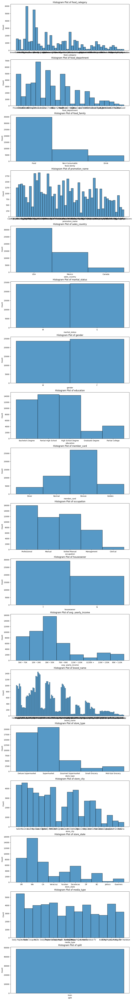

In [67]:
fig,ax = plt.subplots(len(categoric),1,figsize= (12,100))

for x,title in enumerate(categoric):
    sns.histplot(train[title], ax= ax[x])
    ax[x].set_title("Histogram Plot of {}".format(title))

In [ ]:
#Ignore certain categorisations

In [68]:
sns.set_theme("notebook")

In [85]:
train.groupby('store_state')

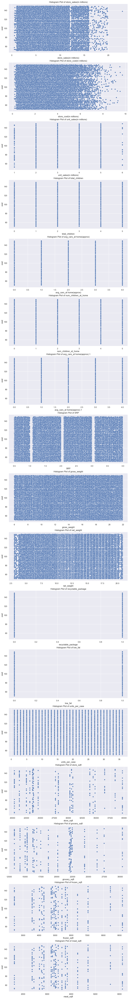

In [86]:
fig,ax = plt.subplots(len(numeric),1,figsize= (12,100))
for x,title in enumerate(numeric):
    sns.scatterplot(x=train[title], y=train['cost'], ax= ax[x])
    ax[x].set_title("Histogram Plot of {}".format(title))

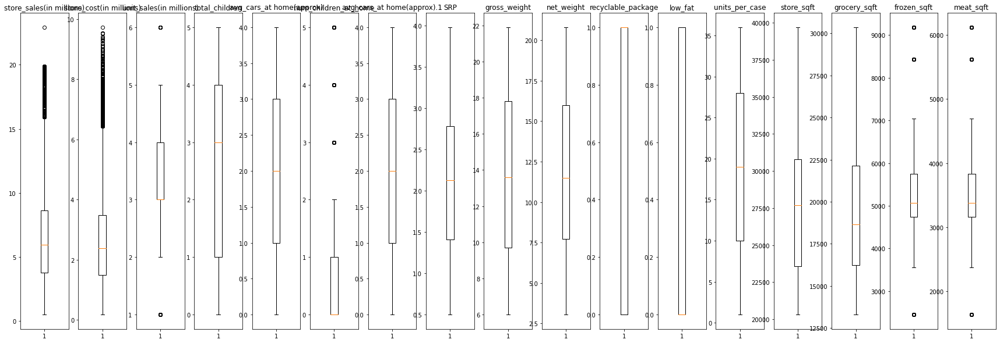

In [114]:
fig, ax = plt.subplots(1,len(numeric), figsize = (30,10))

for i,j in enumerate(numeric):
    ax[i].boxplot(train_df[j])
    ax[i].set_title(j)

{'whiskers': [<matplotlib.lines.Line2D at 0x7f5508ad58d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7f5508a73e90>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f5508a78890>],
 'medians': [<matplotlib.lines.Line2D at 0x7f5508a81990>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f5508a81ed0>],
 'means': []}

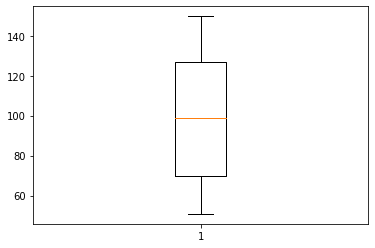

In [115]:
#Target variable
y = train_df['cost']
plt.boxplot(y)

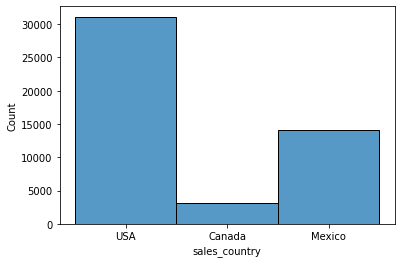

In [116]:
sns.histplot(train_df['sales_country'])

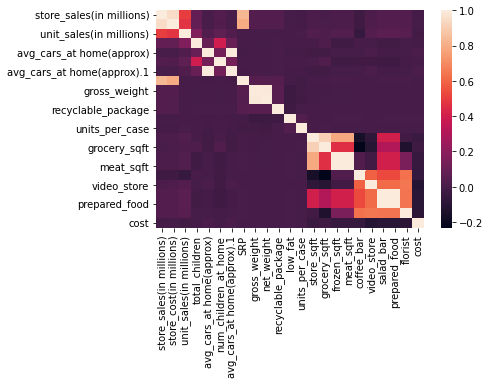

In [117]:
sns.heatmap(train_df.corr())

Assessing if aesthetics affect cost of acquiring a consumer

In [118]:
train_df.loc[:,aesthetic]

,coffee_bar,video_store,salad_bar,prepared_food,florist,cost
262,1.0,1.0,1.0,1.0,1.0,54.11
41069,1.0,1.0,1.0,1.0,1.0,122.77
12786,1.0,1.0,1.0,1.0,1.0,62.40
56570,1.0,0.0,0.0,0.0,0.0,131.58
15023,1.0,1.0,1.0,1.0,1.0,55.59
...,...,...,...,...,...,...
15762,0.0,0.0,1.0,1.0,0.0,106.10
35726,0.0,0.0,0.0,0.0,0.0,79.59
49545,1.0,1.0,1.0,1.0,1.0,131.75
7775,0.0,0.0,0.0,0.0,0.0,57.52


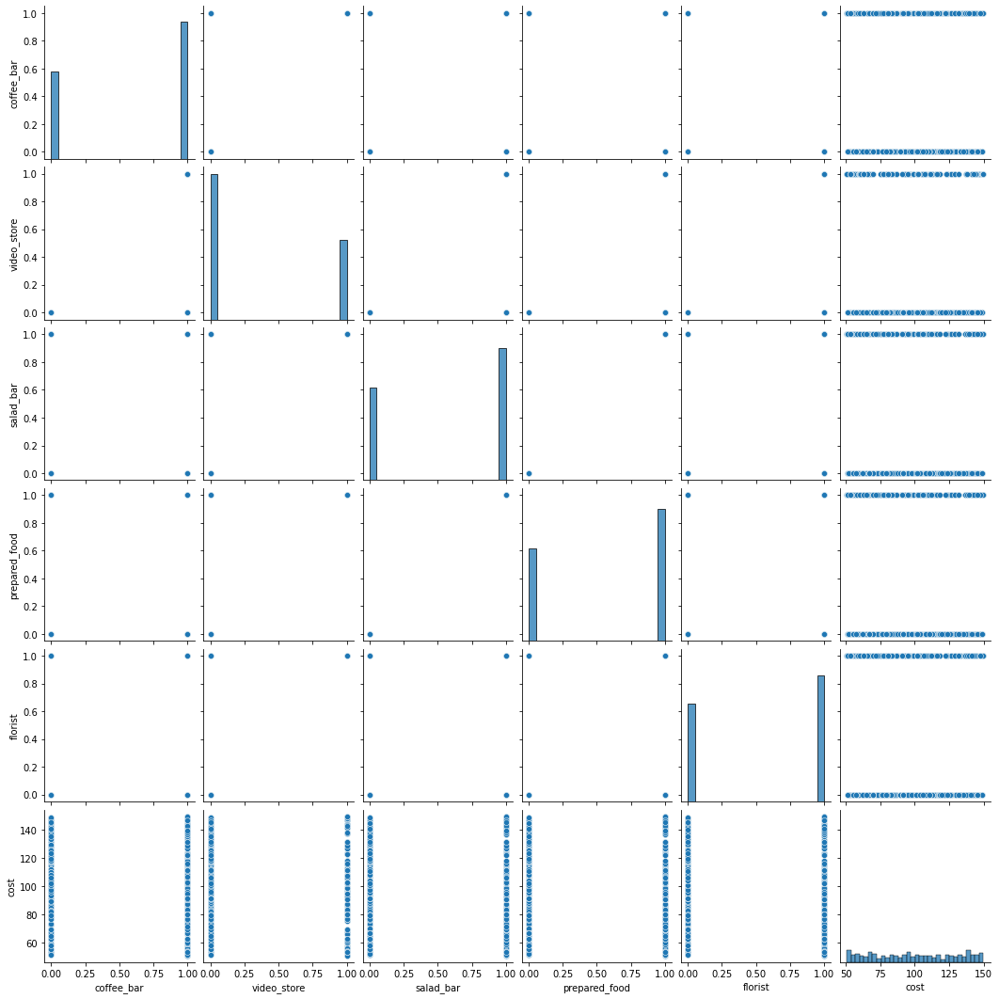

In [119]:
sns.pairplot(train_df.loc[:,aesthetic])

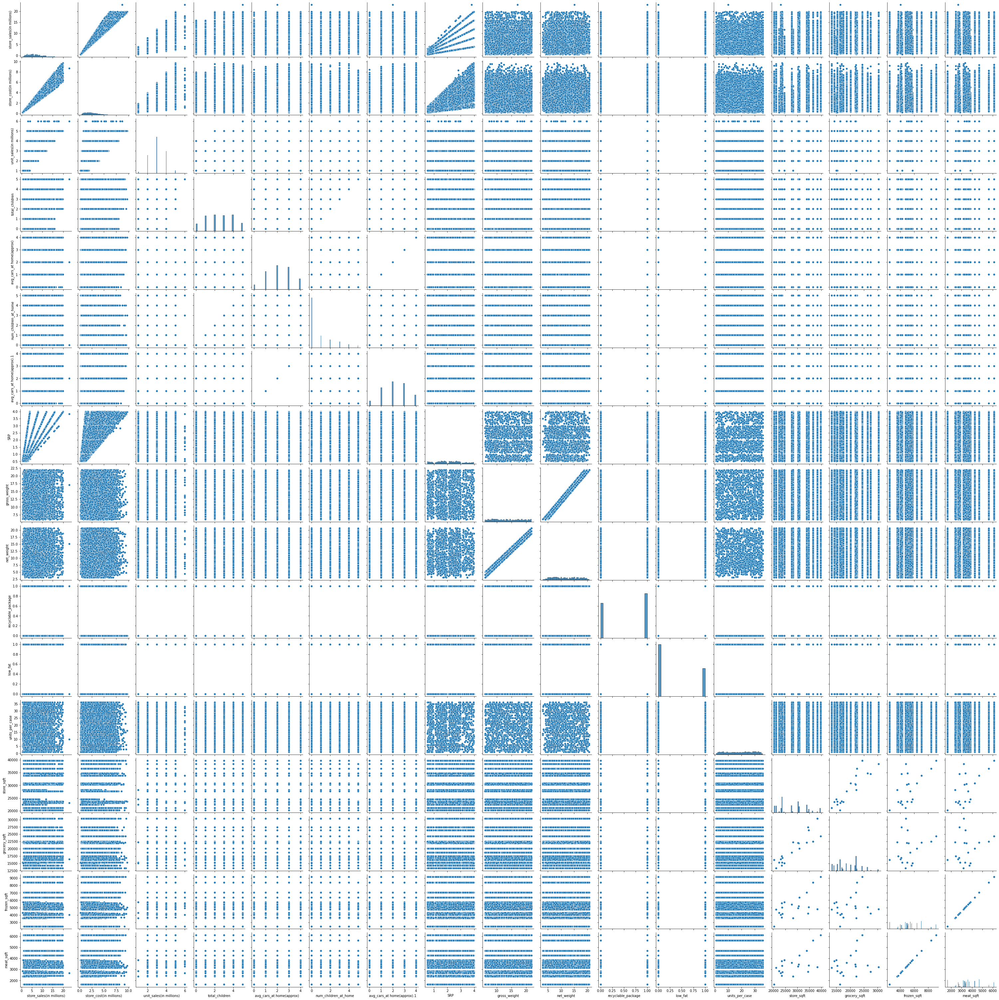

In [120]:
sns.pairplot(train_df.loc[:,numeric])

In [121]:
from sklearn.feature_extraction import DictVectorizer
from sklearn.preprocessing import OneHotEncoder

#Using OneHotEncoding

f_train = pd.get_dummies(train_df.loc[:,categoric])
f_train = np.array(f_train)

f_test = pd.get_dummies(test_df.loc[:,categoric])
f_test = np.array(f_test)

#Using label Encoder
train_2 = train_df.copy()
test_2 = test_df.copy()

for a in list(train_df.loc[:,categoric]):
    le = LabelEncoder()
    train_2[a] = le.fit_transform(train_2[a])
    test_2[a] = le.fit_transform(test_2[a])


d = DictVectorizer() #Alternative to one hot encoding
d = d.fit_transform(dict(train_df.loc[:,categoric]))
d[0,:]

<1x308 sparse matrix of type '<class 'numpy.float64'>'
	with 821814 stored elements in Compressed Sparse Row format>

In [122]:
train_2

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
262,3,1,1,7.86,3.1440,2.0,27,2,0,1,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,11,54.11
41069,3,1,1,13.84,6.6432,4.0,24,0,0,0,...,16418.0,4016.0,2678.0,1.0,1.0,1.0,1.0,1.0,1,122.77
12786,18,13,2,1.62,0.7938,3.0,32,1,0,0,...,20141.0,6393.0,4262.0,1.0,1.0,1.0,1.0,1.0,3,62.40
56570,0,2,1,3.28,1.0824,4.0,8,2,0,0,...,13305.0,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,3,131.58
15023,28,2,1,6.75,3.1725,3.0,6,2,1,1,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,4,55.59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15762,28,2,1,7.77,2.9526,3.0,36,2,0,1,...,24390.0,9184.0,6122.0,0.0,0.0,1.0,1.0,0.0,9,106.10
35726,3,1,1,13.68,6.5664,4.0,42,1,0,0,...,30351.0,4819.0,3213.0,0.0,0.0,0.0,0.0,0.0,3,79.59
49545,1,13,2,1.14,0.4104,2.0,22,2,0,0,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,4,131.75
7775,6,20,1,5.62,2.1918,2.0,44,2,1,0,...,22063.0,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,4,57.52


In [123]:
y = np.array(train_df['cost'])
y_test = np.array(test_df['cost'])
'cost' in categoric
'cost' in numeric

False

In [124]:
ss = StandardScaler() #Standardizing numerical columns
train = ss.fit_transform(train_df.loc[:,numeric])
test = ss.fit_transform(test_df.loc[:, numeric])
print(train.shape)


#OneHotEncoding
new_train = np.concatenate((train, f_train), axis = 1)
new_test = np.concatenate((test, f_test), axis = 1)
new_train

train_2, test_2 #LabelEncoder

model = XGBRegressor()
model = model.fit(new_train, y)

(48342, 17)
[20:51:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
!pip install mlflow
import mlflow
import mlflow.sklearn

import logging

logging.basicConfig(level=logging.WARN)
logger = logging.getLogger(__name__)

In [130]:
def xgboost_init():
    return XGBRegressor()

def objective(trial, train = train,target = y, test = new_test):

    param = {'metric':'rmse',
    'random_state': 48,
    'base_score':trial.suggest_float("base_score",0.5,0.7),
    'reg_alpha':trial.suggest_loguniform("reg_alpha",1e-3,10.0),
    'reg_lambda':trial.suggest_loguniform("reg_lambda",1e-3,10.0),
    "max_depth":trial.suggest_categorical("max_depth", [10,20,100]),
    "learning_rate":trial.suggest_categorical("learning_rate", [0.006,0.008,0.01,0.014,0.02])}

    with mlflow.start_run():
        model = XGBRegressor(**param)

        model.fit(new_train,y,verbose=False)
        
        preds = model.predict(new_test)
        rmse = mean_squared_error(y_test, preds,squared=False)

        #print("Elasticnet model (alpha=%f, l1_ratio=%f):" % (**param))

        mlflow.log_param("param", param)
        mlflow.log_metric("rmse", rmse)

        mlflow.sklearn.log_model(model, "model")
    
    return rmse

In [127]:
y.ndim

1

In [128]:
model

XGBRegressor()

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective,n_trials=50)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

In [139]:
best_model = XGBRegressor(**study.best_trial.params)

best_model.fit(new_train,y)
preds = best_model.predict(new_test)

rmse = mean_squared_error(y_test, preds,squared=False)
rmse

[05:44:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


13.689789087045067

In [ ]:
#hypeparameter tuning with optuna
#weight adjustment
#Create pipeline

array([136.95581 ,  53.430042, 124.564445, ..., 136.69673 , 119.066956,
        80.9135  ], dtype=float32)

In [140]:
pred = best_model.predict(new_train)
mean_squared_error(y, pred)

189.34919728598288

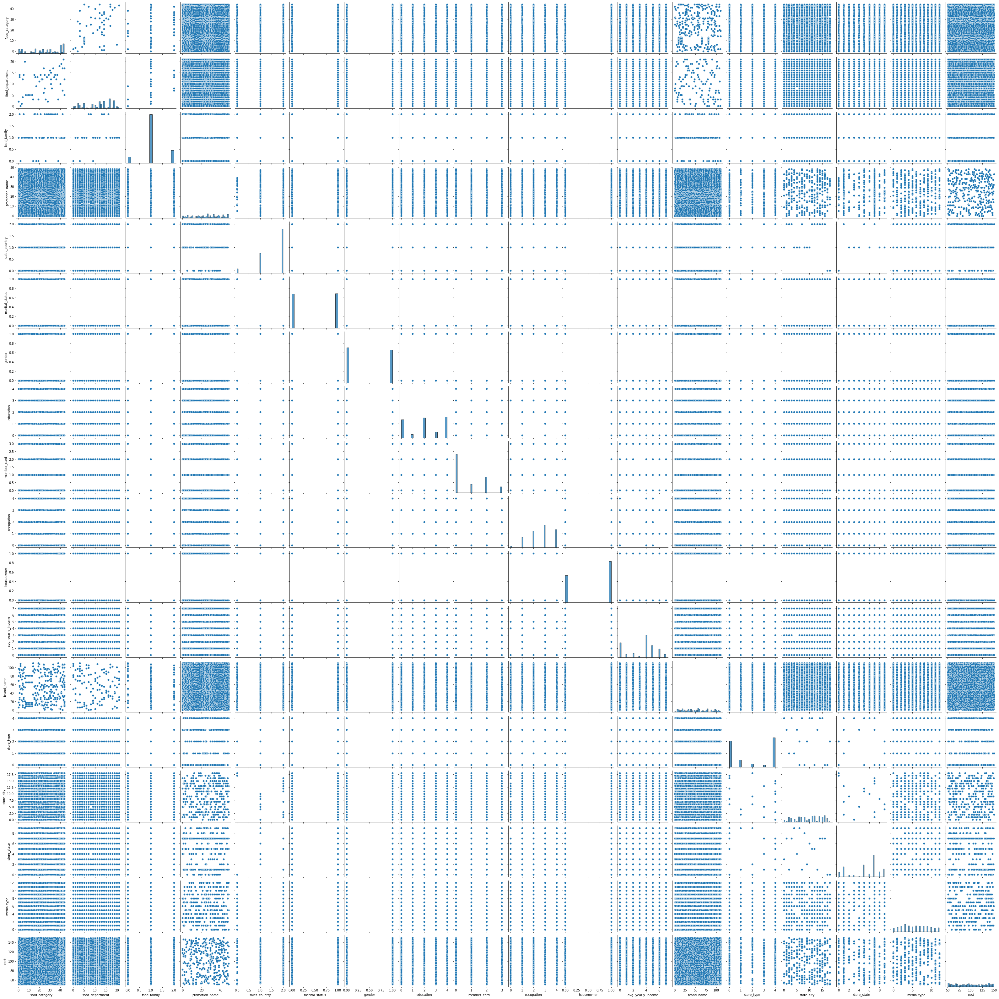

In [159]:
sns.pairplot(train_2.loc[:,categoric].join(train_2['cost']))

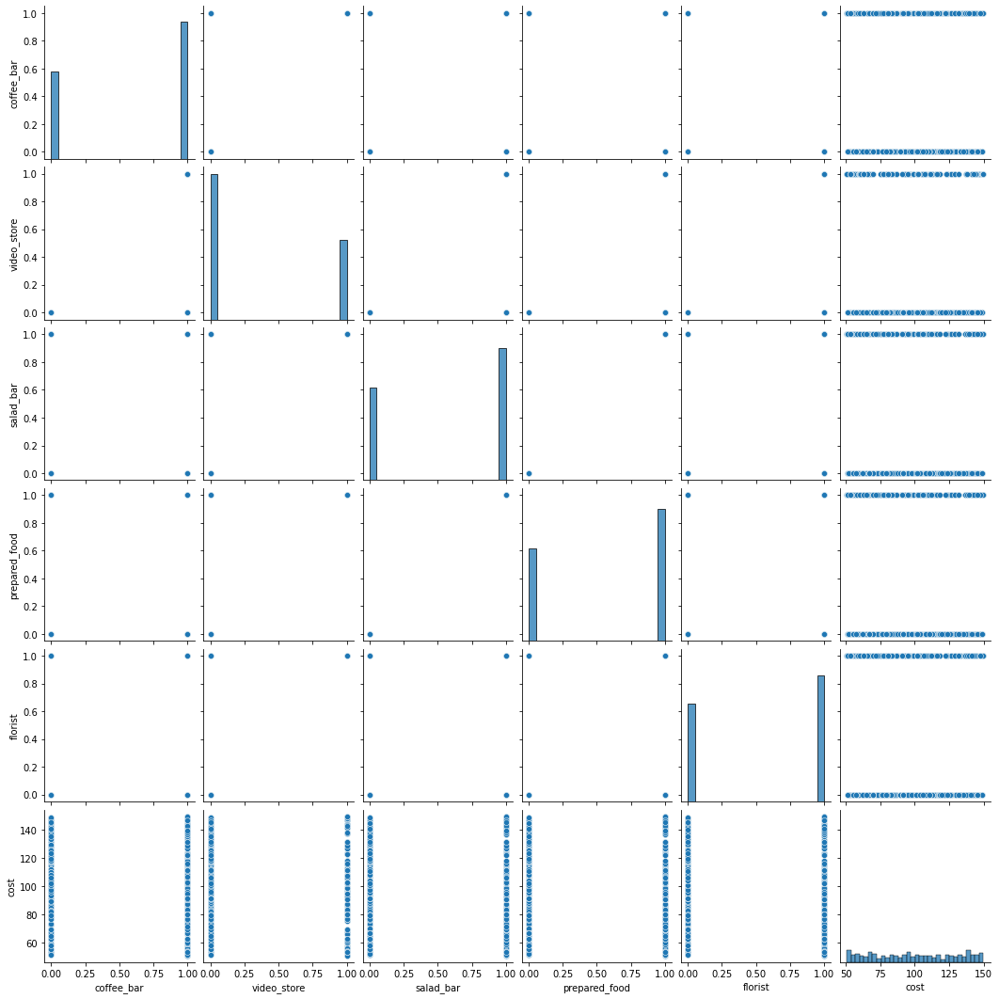

In [149]:
sns.pairplot(train_2.loc[:,aesthetic])

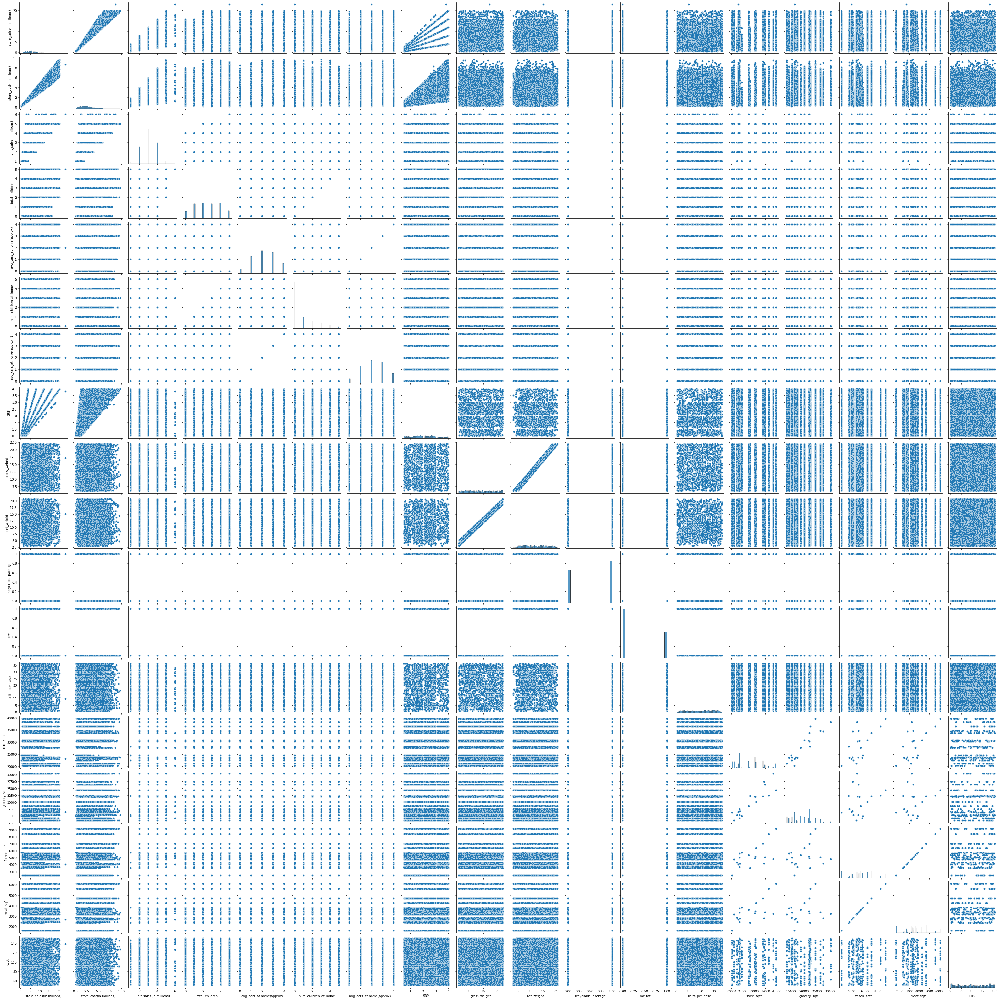

In [157]:
sns.pairplot(train_2.loc[:,numeric].join(train_2['cost']))

In [143]:
model = XGBRegressor() #default
model.fit(train_2, y)

preds_2 = model.predict(test_2)
rmse_2 = mean_squared_error(y_test, preds_2)
rmse_2

[08:20:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


0.010218778817716148

In [160]:
model

XGBRegressor()

In [144]:
def objective_le(trial, train = train_2,target = y, test = test_2):

    param = {'metric':'rmse',
    'random_state': 48,
    'base_score':trial.suggest_float("base_score",0.5,0.7),
    'reg_alpha':trial.suggest_loguniform("reg_alpha",1e-3,10.0),
    'reg_lambda':trial.suggest_loguniform("reg_lambda",1e-3,10.0),
    "max_depth":trial.suggest_categorical("max_depth", [10,20,100]),
    "learning_rate":trial.suggest_categorical("learning_rate", [0.006,0.008,0.01,0.014,0.02])}

    with mlflow.start_run():
        model = XGBRegressor(**param)

        model.fit(new_train,y,verbose=False)
        
        preds = model.predict(new_test)
        rmse = mean_squared_error(y_test, preds,squared=False)

        #print("Elasticnet model (alpha=%f, l1_ratio=%f):" % (**param))

        mlflow.log_param("param", param)
        mlflow.log_metric("rmse", rmse)

        mlflow.sklearn.log_model(model, "model")
    
    return rmse

In [ ]:
study_2 = optuna.create_study(direction='minimize')
study_2.optimize(objective_le,n_trials=50)
print('Number of finished trials:', len(study_2.trials))
print('Best trial:', study_2.best_trial.params)

In [147]:
best_model_2 = XGBRegressor(**study_2.best_trial.params)

best_model_2.fit(new_train,y)
preds_2 = best_model_2.predict(new_test)

rmse = mean_squared_error(y_test, preds_2,squared=False)
rmse

[13:59:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


13.698214451596114

In [148]:
best_model_2

XGBRegressor(base_score=0.6893663002889157, learning_rate=0.02, max_depth=100,
             reg_alpha=3.4944863538639757, reg_lambda=0.17549868012638115)